# Azcapotzalco

In [ ]:
azcapo_data = merged_2023_2024_stations[merged_2023_2024_stations['Alcaldia'] == 'Azcapotzalco']

# Group by 'Colonia' and count the number of trips
trip_count_per_colonia = azcapo_data.groupby('Colonia').size().reset_index(name='Trip_Count')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = azcapo_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the trip count and station count dataframes
merged_data = trip_count_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by trip count and select the top colonias
merged_data = merged_data.sort_values(by='Trip_Count', ascending=False)

# Create a bar chart for trip counts
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=merged_data['Colonia'],
        y=merged_data['Trip_Count'],
        name='Number of Trips',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=merged_data['Colonia'],
        y=merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Number of Trips and Stations per Colonia in Azcapotzalco 2023-2024',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Number of Trips',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

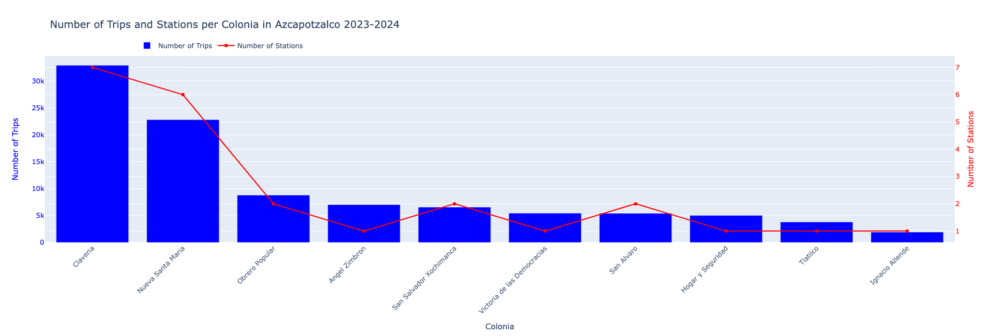

### Alcaldia Azcapotzalco show far less rides the the previous alcadias
### Number of stations vary from 1 - 7pm for various colonias 
### Colonia Claveria shows the highest trips with 32.9k and 7 stations
### Nueva Santa Maria recorded 22.8k trips and has 6 stations
### Obrero Popular falls to 8.8k trips and only 2 stations

In [ ]:
# Group by 'Colonia' and calculate the average trip duration
avg_trip_duration_per_colonia = azcapo_data.groupby('Colonia')['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Group by 'Colonia' and count the number of unique Station_IDs
station_count_per_colonia = azcapo_data.groupby('Colonia')['Station_ID'].nunique().reset_index(name='Station_Count')

# Merge the average trip duration and station count dataframes
merged_data = avg_trip_duration_per_colonia.merge(station_count_per_colonia, on='Colonia')

# Sort the data by average trip duration
top_10_merged_data = merged_data.sort_values(by='Avg_Trip_Duration', ascending=False).head(10)

# Create a bar chart for average trip duration
fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Avg_Trip_Duration'],
        name='Average Trip Duration (minutes)',
        marker_color='blue',
        yaxis='y1'
    )
)

# Add a line for the number of stations
fig.add_trace(
    go.Scatter(
        x=top_10_merged_data['Colonia'],
        y=top_10_merged_data['Station_Count'],
        mode='lines+markers',
        name='Number of Stations',
        marker_color='red',
        yaxis='y2'
    )
)

# Update layout to include secondary y-axis
fig.update_layout(
    title='Average Trip Duration and Number of Stations per Colonia in Azcapotzalco (2023-2024)',
    xaxis=dict(
        title='Colonia',
        tickangle=-45
    ),
    yaxis=dict(
        title='Average Trip Duration (minutes)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title='Number of Stations',
        titlefont=dict(color='red'),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        x=0.1,
        y=1.1,
        orientation='h'
    ),
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

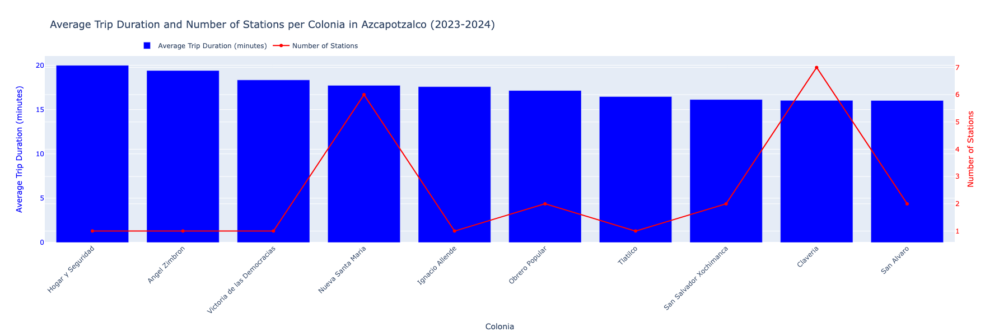

### Colonia with the highest trip duration is Hogar y Seguridad with 19.9 min while only have 1 station
### The next 2 colonias also only have 1 station each, Angel Zimbron with 19.4min and Victoria de las Democracias with 18.3 min

In [ ]:
# Extract coordinates for all unique stations in Benito Juárez
coords = azcapo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and calculate the average trip duration for the top 10 stations
avg_trip_duration_per_station = azcapo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')
top_10_stations = avg_trip_duration_per_station.sort_values(by='Avg_Trip_Duration', ascending=False).head(5)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab10', 10).colors  # 'tab10' is a colormap with 10 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Benito Juárez boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Azcapotzalco Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Avg Trip Duration: {row['Avg_Trip_Duration']:.2f} minutes",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

  # Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 5 Stations by Avg Trip Duration in Azcapotzalco</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))
  
# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 320px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Top 5 Stations by Avg Trip Duration</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

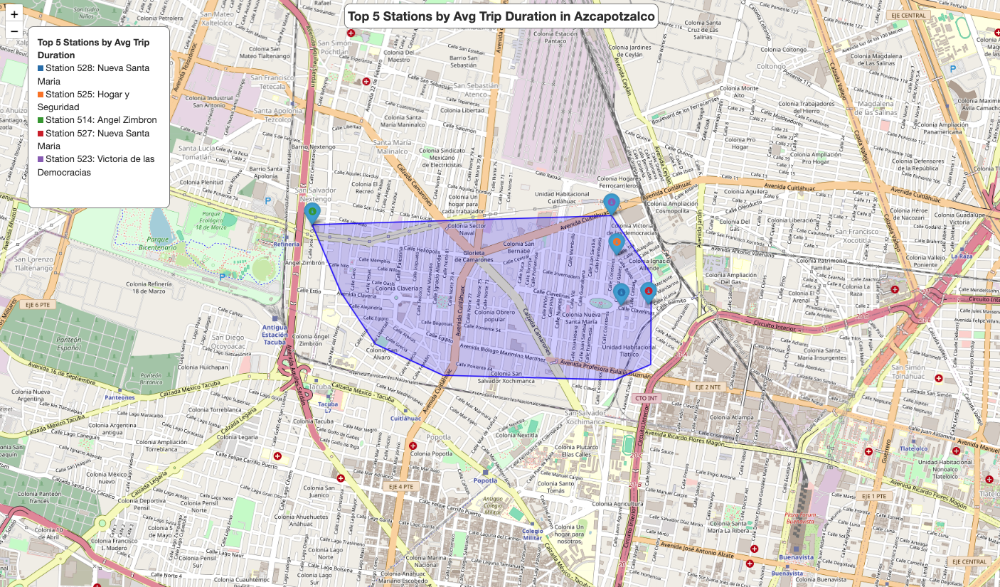

### Top 5 stations by avg trip duration are located on the top boundry of azcapotzalco and also on the north east edge 

In [ ]:
# Group by 'Station_ID' and count the number of trips for the top 10 stations
trip_count_per_station = azcapo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
top_10_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False).head(5)

# Generate a color map for the top 10 stations
colors = plt.cm.get_cmap('tab20', 10).colors  # 'tab20' is a colormap with 20 colors
color_map = {station: colors[i] for i, station in enumerate(top_10_stations['Station_ID'])}
color_map_hex = {station: mcolors.rgb2hex(color) for station, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top 10 stations
mean_lat_lon = top_10_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Miguel Hidalgo boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Azcapotzalco Area'
).add_to(mymap)

# Add a marker for each of the top 10 stations with color based on Station_ID
for idx, row in top_10_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Station_ID']])
    ).add_to(mymap)

      # Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 5 Stations by Trip CountAzcapotzalco</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))
  
    
# Add a legend for top 10 stations
legend_html = '''
     <div style="position: absolute; 
     top: 50px; left: 50px; width: 250px; height: 200px; 
     background-color: white; z-index:9999; font-size:16px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Stations</b><br>
     '''
for idx, row in top_10_stations.iterrows():
    legend_html += f'<i style="background:{color_map_hex[row["Station_ID"]]}; width: 10px; height: 10px; display: inline-block;"></i> Station {row["Station_ID"]}: {row["Colonia"]}<br>'
legend_html += '</div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

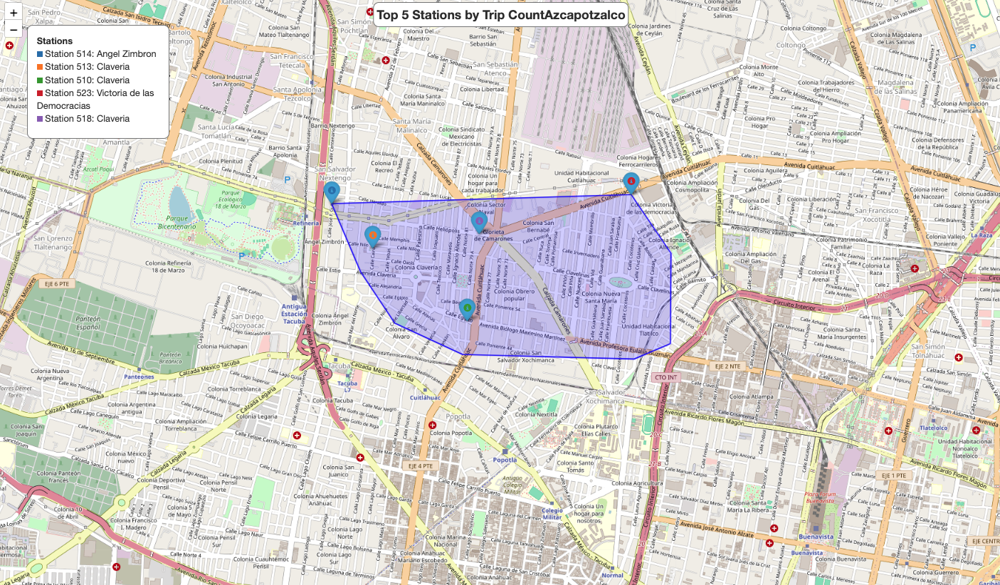

### Top stations for trip count are located on the top right and left corner of the boundry and also in the middle which is on a main avenue

In [ ]:
# Group by 'Month' and 'Colonia' and count the number of trips
trip_count_per_month_colonia = azcapo_data.groupby(['Month', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 10 colonias for each month
top_10_colonias_per_month_count = trip_count_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_count, x='Month', y='Trip_Count', color='Colonia', barmode='group',
             title='Colonias by Number of Trips per Month in Azcapotzalco 2023-2024',
             labels={'Month': 'Month', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

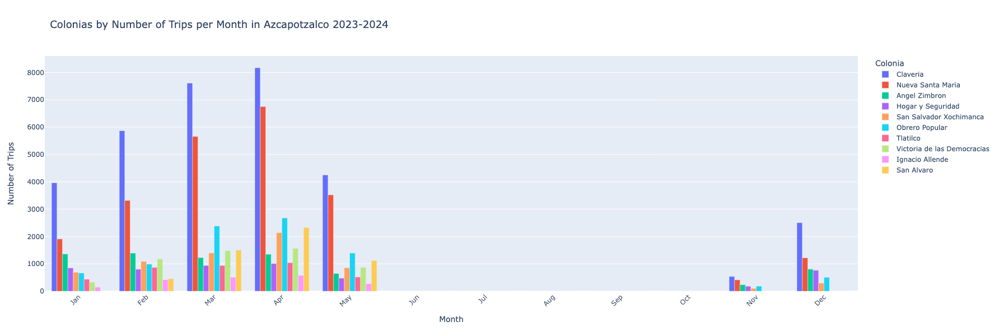

### Monthly data shows April to be the busiest month for azapotzalco with Claveria recording the hiighest amount of trips for april with 8.1k
### Claveria shows that it is the most popular colonia for bike users for all months 

### Nueva santa maria is also worth noting for recording second highest amoutn of trips with 6.7k in april
### The reason there is not data shown for the months of of june - oct is because ECO BICI did not introduce stations to Azcapotzalco or Alvaro Obregon until November 2023

In [ ]:
# Group by 'Month' and 'Colonia' and calculate the average trip duration
avg_trip_duration_per_month_colonia = azcapo_data.groupby(['Month', 'Colonia'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Get the top 10 colonias for each month by average trip duration
top_10_colonias_per_month_duration = avg_trip_duration_per_month_colonia.groupby('Month').apply(lambda x: x.nlargest(10, 'Avg_Trip_Duration')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_month_duration, x='Month', y='Avg_Trip_Duration', color='Colonia', barmode='group',
             title='Colonias by Average Trip Duration per Month in Azcapotzalco (2023-2024)',
             labels={'Month': 'Month', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Month',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show month names
fig.update_xaxes(tickmode='array', tickvals=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                 ticktext=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Show the plot
fig.show()

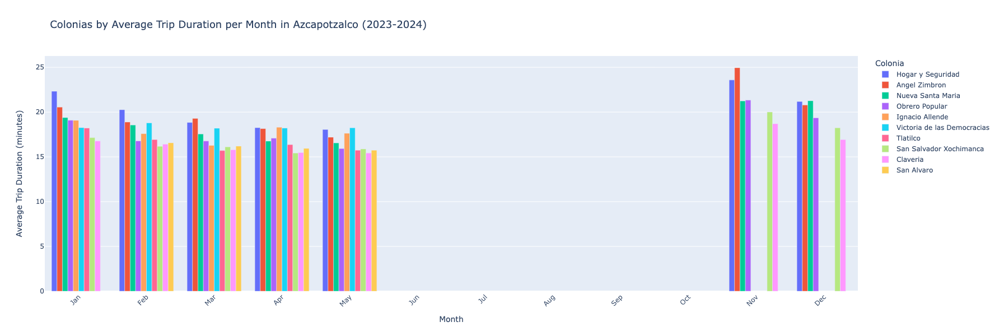

### trip duration recorded the highest in november with Angel Zimbron at 24.9 min 
### Other months tops trip duration by Hogar y Seguridad

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias_count = top_10_colonias_per_month_count['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data_count = azcapo_data[azcapo_data['Colonia'].isin(top_colonias_count)]

# Group by 'Colonia' and 'Age_Group' and count the number of trips
trip_count_per_colonia_age_group = filtered_data_count.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_age_group, x='Colonia', y='Trip_Count', color='Age_Group', barmode='group',
             title='Trip Counts for Each Age Group in Top Colonias of Azcapotzalco',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

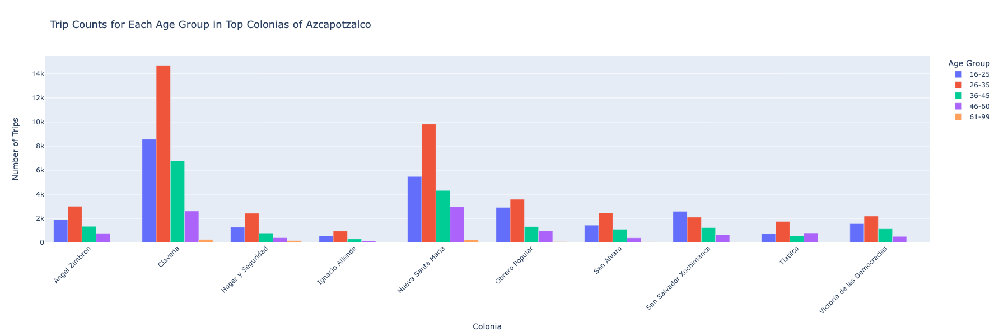

### trip counts by age group show that Claveri and Nueva Santa maria hold the most trips with 26-35 leading for both colonias 
### San Salvador Xochimanca shows more trips by 16-25 age group than 26-35

In [ ]:
# Extract the unique colonias from the top 10 lists
top_colonias = top_10_colonias_per_month_duration['Colonia'].unique()

# Filter the original data to include only the top colonias
filtered_data = azcapo_data[azcapo_data['Colonia'].isin(top_colonias)]

# Group by 'Colonia', 'Age_Group', and 'Month' to calculate the average trip duration for each age group in these colonias
avg_trip_duration_per_colonia_age_group = filtered_data.groupby(['Colonia', 'Age_Group'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_age_group, x='Colonia', y='Avg_Trip_Duration', color='Age_Group', barmode='group',
             title='Average Trip Duration by Age Group in Top Colonias of Azcapotzalco (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Age_Group': 'Age Group'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

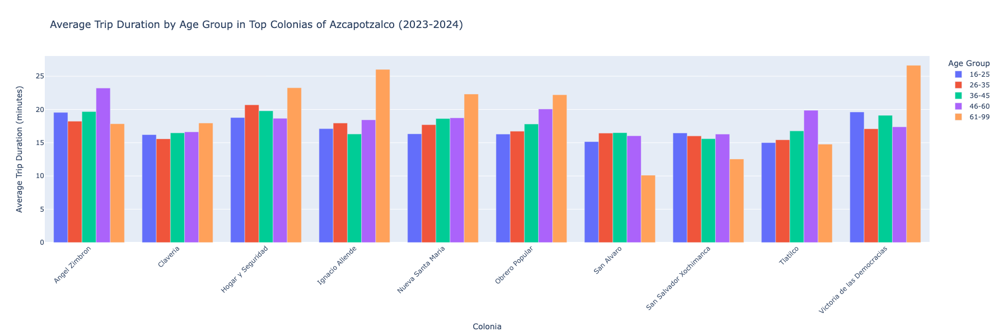

### Average trip duration by age group shows that 61-99 lead out of all other ages for multiple colonias like Ignacio allende, hogar y seguridad, nueva santa maria, obrero popular and Victoria de las democracias
### angel zimbron show 46-60 leading  as well as tlatilco

In [ ]:
# Group by 'Colonia' and 'Gender' and count the number of trips
trip_count_per_colonia_gender = filtered_data_count.groupby(['Colonia', 'Gender']).size().reset_index(name='Trip_Count')

# Create a bar chart
fig = px.bar(trip_count_per_colonia_gender, x='Colonia', y='Trip_Count', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Trip Counts for Each Gender in Top Colonias of Azcapotzalco (2023-2024)',
             labels={'Colonia': 'Colonia', 'Trip_Count': 'Number of Trips', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

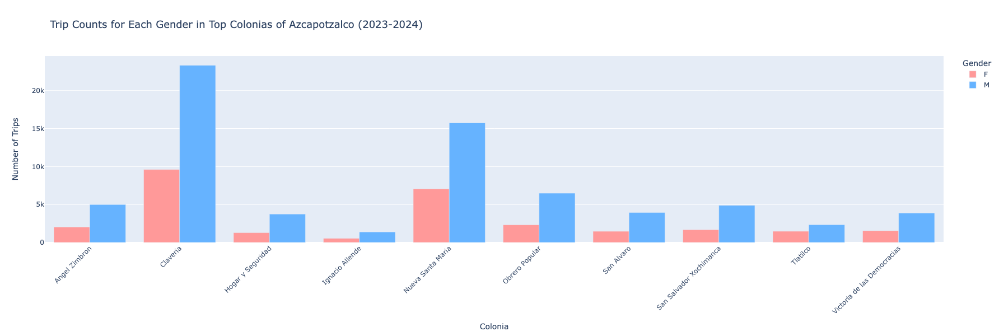

### trip count by gender shows males use bikes far more with the exception of tlaltilco
### tlatilco recorded 2.3k for males and 1.4k for females

In [ ]:
# Group by 'Colonia' and 'Gender' and calculate the average trip duration
avg_trip_duration_per_colonia_gender = filtered_data.groupby(['Colonia', 'Gender'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Create a bar chart
fig = px.bar(avg_trip_duration_per_colonia_gender, x='Colonia', y='Avg_Trip_Duration', color='Gender', barmode='group', color_discrete_map=gender_colors,
             title='Average Trip Duration by Gender in Top Colonias of Azcapotzalco (2023-2024)',
             labels={'Colonia': 'Colonia', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Gender': 'Gender'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

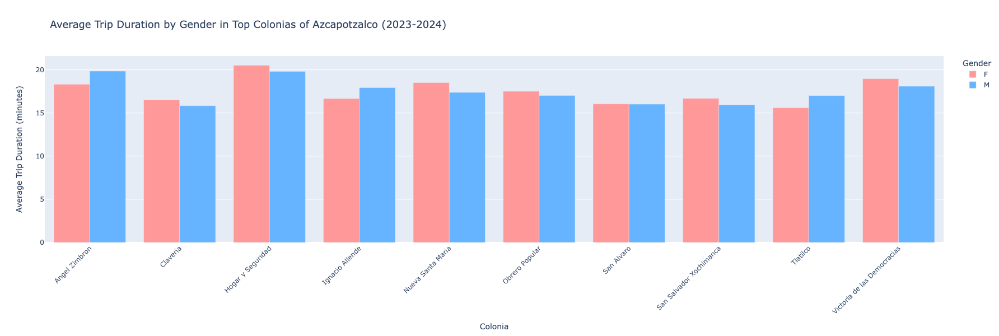

### Trip duration by gender shows that for some colonias males actually record longer durations than females, like Angel Zimbron, ignacio allende and tlatilco

In [ ]:
# Calculate the total number of individuals in each colonia
total_count_per_colonia = azcapo_data.groupby('Colonia').size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia
female_count_per_colonia = azcapo_data[azcapo_data['Gender'] == 'F'].groupby('Colonia').size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data = total_count_per_colonia.merge(female_count_per_colonia, on='Colonia')

# Calculate the percentage of females in each colonia
merged_data['Female_Percentage'] = (merged_data['Female_Count'] / merged_data['Total_Count']) * 100

# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Create a bar chart for the top 10 colonias with the highest percentage of females
fig = px.bar(top_10_female_percentage_colonias, x='Colonia', y='Female_Percentage', color='Colonia',
             title='Colonias in Azcapotzalco with the Highest Percentage of Females',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

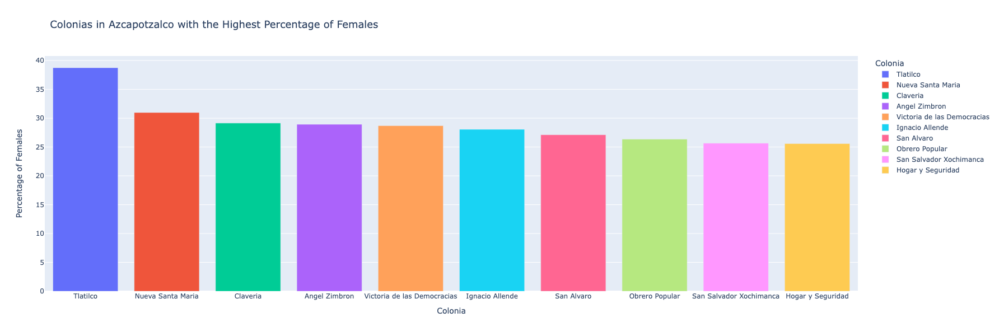

### tlatilco stands out as the colonia with the highest percentage of females with 38.7% 
### colonia nueva santa maria shows 30% females
### claveria shows 29% females

In [ ]:
# Calculate the total number of individuals in each colonia and age group
total_count_per_colonia_age = azcapo_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Total_Count')

# Calculate the number of females in each colonia and age group
female_count_per_colonia_age = azcapo_data[azcapo_data['Gender'] == 'F'].groupby(['Colonia', 'Age_Group']).size().reset_index(name='Female_Count')

# Merge the total count and female count dataframes
merged_data_age = total_count_per_colonia_age.merge(female_count_per_colonia_age, on=['Colonia', 'Age_Group'], how='left').fillna(0)

# Calculate the percentage of females in each colonia and age group
merged_data_age['Female_Percentage'] = (merged_data_age['Female_Count'] / merged_data_age['Total_Count']) * 100

# Calculate overall percentage of females in each colonia
overall_female_percentage = merged_data_age.groupby('Colonia')['Female_Count'].sum() / merged_data_age.groupby('Colonia')['Total_Count'].sum() * 100
overall_female_percentage = overall_female_percentage.reset_index(name='Overall_Female_Percentage')

# Merge the overall female percentage with the age group data
merged_data_age = merged_data_age.merge(overall_female_percentage, on='Colonia')

# Sort the data by the overall percentage of females and select the top 10 colonias
top_10_colonias = overall_female_percentage.sort_values(by='Overall_Female_Percentage', ascending=False).head(10)['Colonia']
filtered_data_age = merged_data_age[merged_data_age['Colonia'].isin(top_10_colonias)]

# Create a grouped bar chart for the top 10 colonias with the highest percentage of females by age group
fig = px.bar(filtered_data_age, x='Colonia', y='Female_Percentage', color='Age_Group', barmode='group',
             title='Colonias in Azcapotzalco with the Highest Percentage of Females by Age Group',
             labels={'Colonia': 'Colonia', 'Female_Percentage': 'Percentage of Females'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Females',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Show the plot
fig.show()

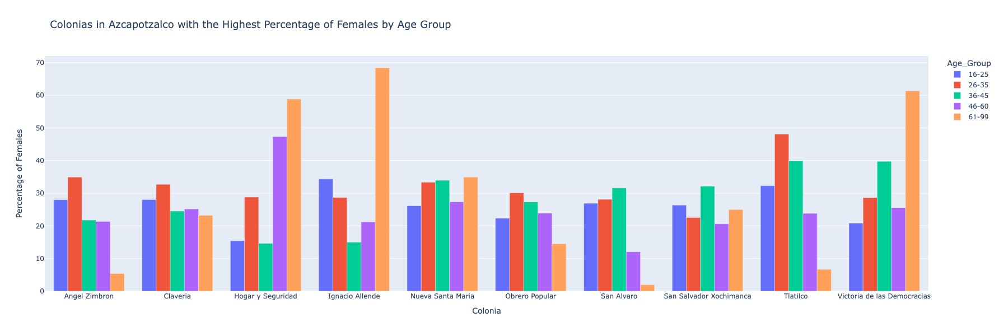

### Female percentage by age group shows that hogar y seguridad, ignacio allende and victoria de las democracias stand out as the highest percentage above 50%
### tlatilco stands out with 48.1% females for age group 26-35

In [ ]:
# Extract coordinates for all unique stations in Azcapotzalco data
coords = azcapo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for all stations
trip_count_per_station = azcapo_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')
all_stations = trip_count_per_station.sort_values(by='Trip_Count', ascending=False)

# Generate a color map for the colonias
colonias = all_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of all stations
mean_lat_lon = all_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Azcapotzalco boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Azcapotzalco Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in all_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Trip Count: {row['Trip_Count']}",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)

# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Colonias and Stations for Azcapotzalco</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))    

# Add a legend for the colonias
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

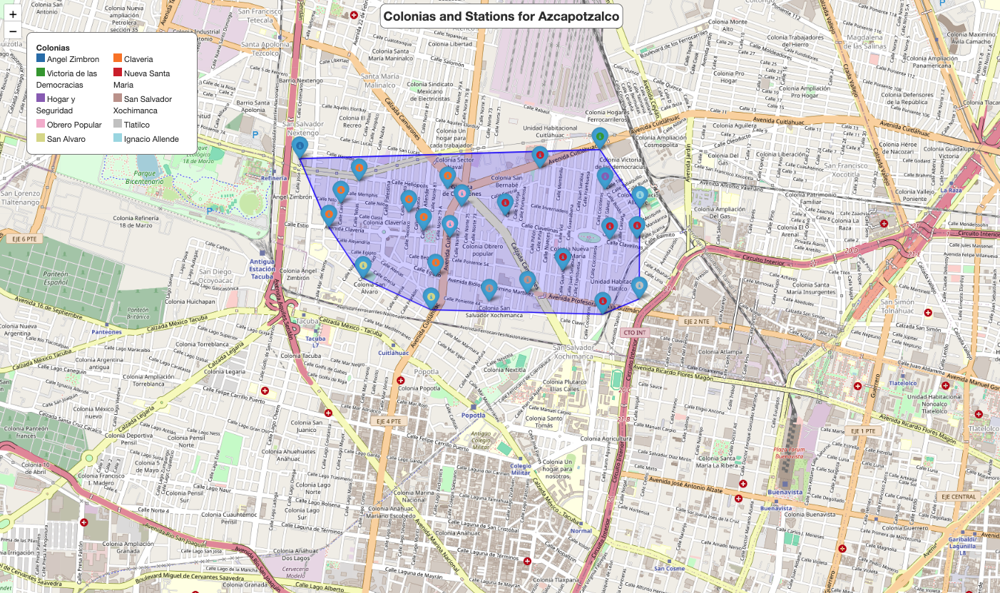

In [ ]:
# Sort the data by the percentage of females and select the top 10 colonias
top_10_female_percentage_colonias = merged_data.sort_values(by='Female_Percentage', ascending=False).head(10)

# Filter the original data to include only the stations in the top colonias
top_colonias = top_10_female_percentage_colonias['Colonia'].unique()
filtered_data = azcapo_data[azcapo_data['Colonia'].isin(top_colonias)]

# Extract coordinates for all unique stations in Coyoacan data
coords = azcapo_data[['Latitude', 'Longitude']].drop_duplicates().values

# Compute the convex hull for all unique stations
hull = ConvexHull(coords)
hull_coords = [coords[vertex].tolist() for vertex in hull.vertices] + [coords[hull.vertices[0]].tolist()]

# Group by 'Station_ID' and count the number of trips for the stations in top colonias
trip_count_per_station = filtered_data.groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Trip_Count')

# Calculate the number of females in each colonia and station
female_count_per_station = filtered_data[filtered_data['Gender'] == 'F'].groupby(['Station_ID', 'Colonia', 'Latitude', 'Longitude']).size().reset_index(name='Female_Count')

# Merge trip count and female count dataframes
merged_station_data = trip_count_per_station.merge(female_count_per_station, on=['Station_ID', 'Colonia', 'Latitude', 'Longitude'], how='left').fillna(0)
merged_station_data['Female_Percentage'] = (merged_station_data['Female_Count'] / merged_station_data['Trip_Count']) * 100

# Sort the stations by Female_Percentage and get the top 10 stations
top_stations = merged_station_data.sort_values(by='Female_Percentage', ascending=False).head(5)

# Generate a color map for the colonias (only those present in the filtered data)
colonias = top_stations['Colonia'].unique()
colors = plt.cm.get_cmap('tab20', len(colonias)).colors  # 'tab20' is a colormap with 20 colors
color_map = {colonia: colors[i % 20] for i, colonia in enumerate(colonias)}
color_map_hex = {colonia: mcolors.rgb2hex(color) for colonia, color in color_map.items()}

# Create a Folium map centered at the mean latitude and longitude of the top stations
mean_lat_lon = top_stations[['Latitude', 'Longitude']].mean()
map_center = [mean_lat_lon['Latitude'], mean_lat_lon['Longitude']]
mymap = folium.Map(location=map_center, zoom_start=14)

# Add a polygon layer for the Coyoacan boundary
folium.Polygon(
    locations=hull_coords,
    color='blue',
    fill=True,
    fill_opacity=0.2,
    weight=2,
    popup='Azcapotzalco Area'
).add_to(mymap)

# Add a marker for each of the stations with color based on Colonia
for idx, row in top_stations.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Station: {row['Station_ID']}<br>Colonia: {row['Colonia']}<br>Female Percentage: {row['Female_Percentage']:.2f}%",
        icon=folium.Icon(color='blue', icon_color=color_map_hex[row['Colonia']])
    ).add_to(mymap)
    
# Add a title to the map
title_html = '''
     <div style="position: fixed; 
     top: 10px; left: 50%; transform: translateX(-50%); width: auto; height: auto; 
     background-color: white; z-index:9999; font-size:22px;
     border:2px solid grey; border-radius: 10px; padding: 5px;">
     <b>Top 10 Stations with Highest Female Usage in Azcapotzalco</b>
     </div>
     '''
mymap.get_root().html.add_child(folium.Element(title_html))

# Create a legend for the colonias (only those present in the map)
legend_html = '''
     <div style="position: absolute; 
     top: 60px; left: 50px; width: 300px; height: auto; 
     background-color: white; z-index:9999; font-size:14px;
     border:2px solid grey; border-radius: 10px; padding: 16px;">
     <b>Colonias</b><br>
     <div style="display: grid; grid-template-columns: 1fr 1fr; gap: 5px;">
     '''
for colonia in colonias:
    legend_html += f'<div><i style="background:{color_map_hex[colonia]}; width: 15px; height: 15px; display: inline-block;"></i> {colonia}</div>'
legend_html += '</div></div>'

mymap.get_root().html.add_child(folium.Element(legend_html))

# Display the map
mymap

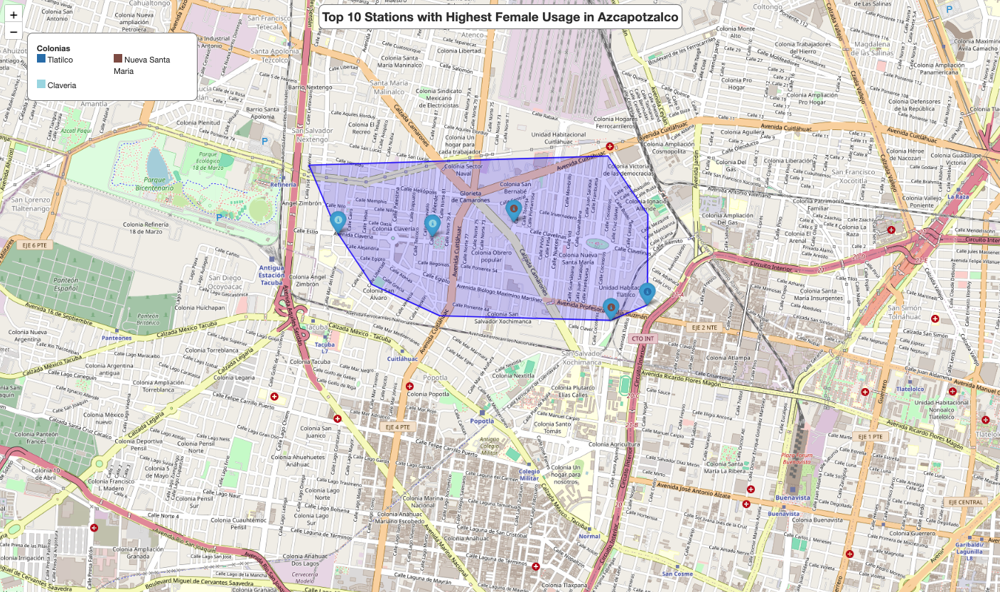

In [ ]:
# Calculate the average trip count per day for each colonia
avg_trip_count_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].size().reset_index(name='Trip_Count')

avg_trip_count_per_colonia_day = avg_trip_count_per_colonia_day.groupby(['Colonia', 'Week_Day']).mean().reset_index()

# Sort the data to get the top 10 colonias by average trip count
top_10_colonias = avg_trip_count_per_colonia_day.groupby('Colonia')['Trip_Count'].mean().sort_values(ascending=False).head(10).index

filtered_avg_trip_count = avg_trip_count_per_colonia_day[avg_trip_count_per_colonia_day['Colonia'].isin(top_10_colonias)]

# Create a grouped bar plot for the average trip count for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_count, 
             x='Week_Day', 
             y='Trip_Count', 
             color='Colonia', 
             barmode='group',
             title='Average Trip Count for Colonias per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Trip_Count': 'Average Trip Count'},
             height=600, 
             width=1700)

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Count',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        x=0.85,
        y=1.03,
        bgcolor='rgba(255, 255, 255, 0.5)',  # Background color with some transparency
        bordercolor='Black',
        borderwidth=2
    )
)

# Show the plot
fig.show()

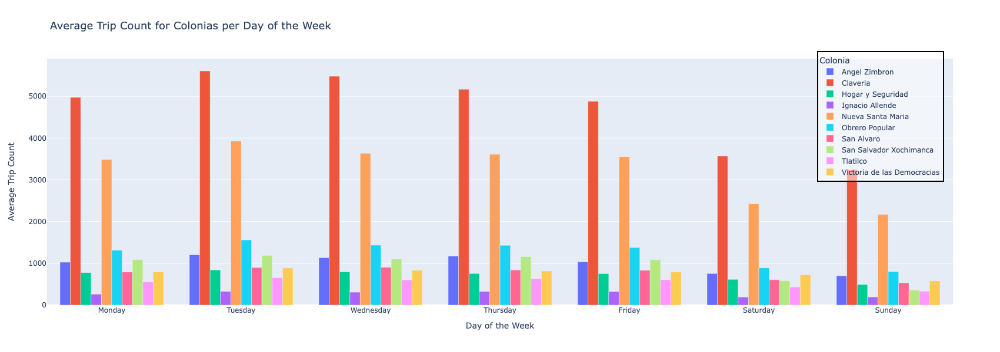

### Daily avg trip count shows claveria and nueva santa maria as the top colonias with most trips with tuesday showing the most activity out of thr week and sunday the least

In [ ]:
# Calculate the average trip duration per day for each colonia
avg_trip_duration_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Sort the data to get the top 10 colonias by average trip duration
top_10_colonias = avg_trip_duration_per_colonia_day.groupby('Colonia')['Avg_Trip_Duration'].mean().sort_values(ascending=False).head(10).index

# Filter the data to include only the top 10 colonias
filtered_avg_trip_duration = avg_trip_duration_per_colonia_day[avg_trip_duration_per_colonia_day['Colonia'].isin(top_10_colonias)]

# Create a grouped bar plot for the average trip duration for top 10 colonias per day of the week
fig = px.bar(filtered_avg_trip_duration, 
             x='Week_Day', 
             y='Avg_Trip_Duration', 
             color='Colonia', 
             barmode='group',
             title='Colonias with highest Trip Duration per Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)'},
             height=600, 
             width=1600)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

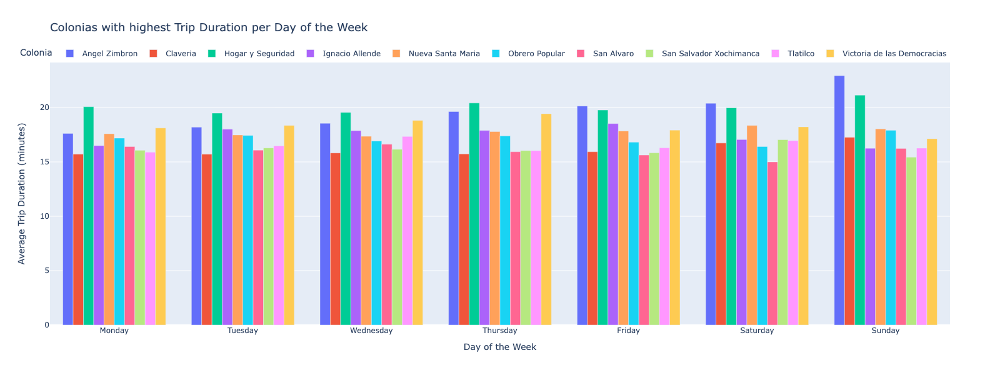

### Daily trip duration shows hogar y segridad with the highest from monday - thursday and Angel zimbron for friday - sunday

In [ ]:
# Calculate the number of trips made by females and males for each colonia
gender_counts = filtered_data.groupby(['Colonia', 'Gender']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = gender_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the gender counts with the total counts to calculate percentages
merged_data = pd.merge(gender_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100

# Define color mapping for age groups
color_map = {
    'F': 'pink',
    'M': 'blue'
}

# Create a stacked bar chart to show the gender distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Gender', 
             title='Gender Distribution for Colonias in Azcapotzalco by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='group',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

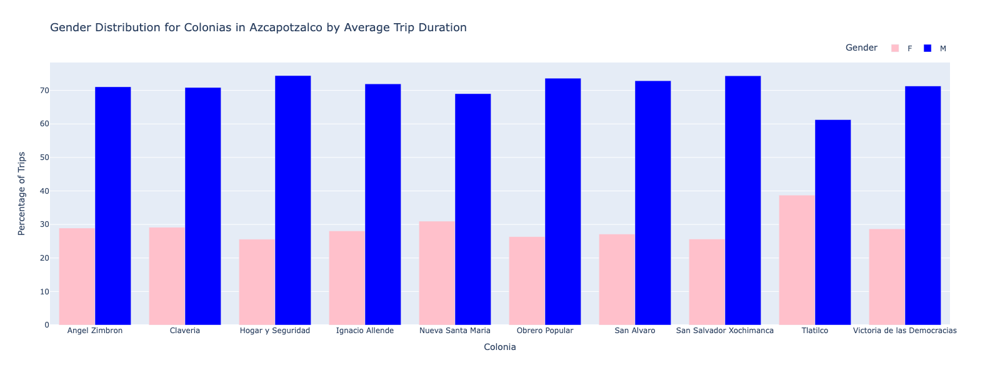

### Tlatilco is the colonia that stands out again with 38.7 percent females, this could be a great place to target more females.

In [ ]:
# Calculate the number of trips made by each age group for each colonia
age_group_counts = filtered_data.groupby(['Colonia', 'Age_Group']).size().reset_index(name='Count')

# Calculate the total number of trips for each colonia
total_counts = age_group_counts.groupby('Colonia')['Count'].sum().reset_index(name='Total_Count')

# Merge the age group counts with the total counts to calculate percentages
merged_data = pd.merge(age_group_counts, total_counts, on='Colonia')
merged_data['Percentage'] = (merged_data['Count'] / merged_data['Total_Count']) * 100


# Create a stacked bar chart to show the age group distribution as percentages for each colonia
fig = px.bar(merged_data, 
             x='Colonia', 
             y='Percentage', 
             color='Age_Group', 
             title='Age Group Distribution for Colonias in Azcapotzalco by Average Trip Duration',
             labels={'Colonia': 'Colonia', 'Percentage': 'Percentage of Trips'},
             height=600, 
             width=1600,
             barmode='stack',
             color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Colonia',
    yaxis_title='Percentage of Trips',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',  # Set legend orientation to horizontal
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

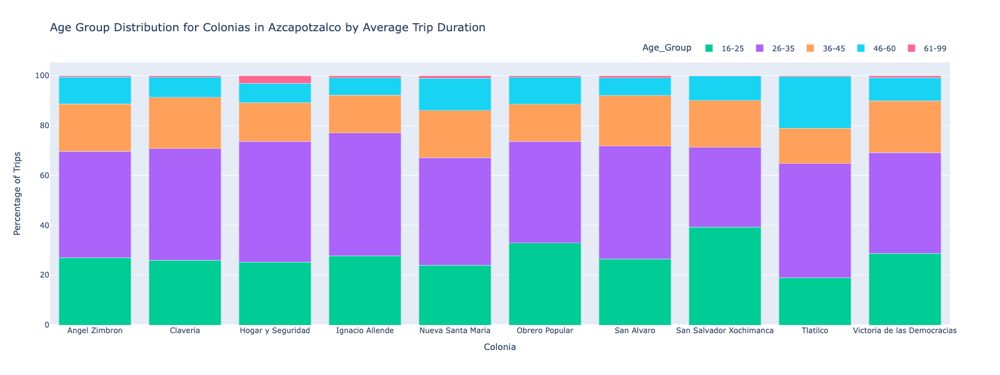

### Age group distribution shows that san salvador xochiminca with 39% for 16-25 

In [ ]:
# Calculate the average trip duration for each age group per day of the week
avg_trip_duration_per_age_group_day = azcapo_data.groupby(['Age_Group', 'Week_Day'])['Trip_Duration'].mean().reset_index()

# Create the line chart with Plotly
fig = px.line(avg_trip_duration_per_age_group_day, 
              x='Week_Day', 
              y='Trip_Duration', 
              color='Age_Group', 
              title='Average Trip Duration per Age Group by Day of the Week for Azcapotzalco',
              labels={'Week_Day': 'Day of the Week', 'Trip_Duration': 'Average Trip Duration (minutes)'},
              markers=True,
              height=600, 
              width=1700,
              color_discrete_map=color_map)

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Average Trip Duration (minutes)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    )
)

# Show the plot
fig.show()

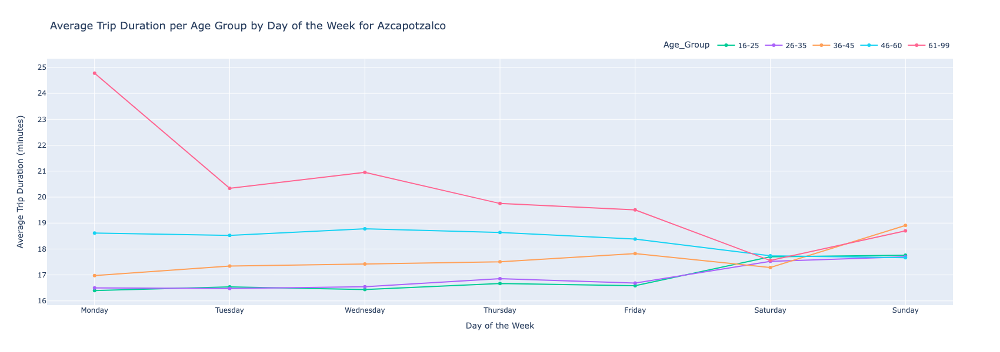

### Daily trip duration for age group 61-99 start of very high with almost 25 min for monday and decreases 17.5min on saturday 
### Age 46-60 also decrease throughout the week while age group 16-25 and 26-35 start low and increase as the week progresses 

In [ ]:
# Filter the data for the age group 46-60
age_group_61_99_data = azcapo_data[azcapo_data['Age_Group'] == '61-99']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_61_99_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_61_99'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_61_99')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_61_99', 
             color='Colonia', 
             title='Percentage of Age Group 61-99 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_61_99': 'Percentage of Age Group 61-99 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 61-99 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

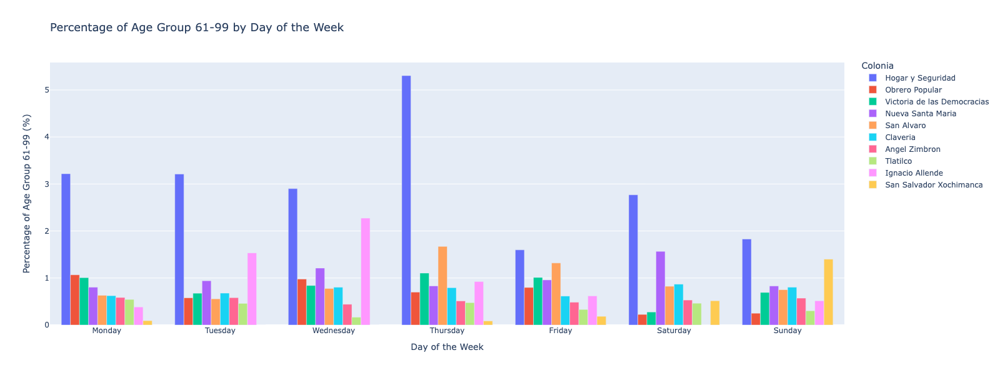

### Percentage of age group 61-99 per day show hogar y seguridad lead everyday with thursday being the highest of 5.3%

In [ ]:
# Filter the data for the age group 46-60
age_group_46_60_data = azcapo_data[azcapo_data['Age_Group'] == '46-60']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_46_60_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_46_60'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_46_60')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_46_60', 
             color='Colonia', 
             title='Percentage of Age Group 46-60 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_46_60': 'Percentage of Age Group 46-60 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 46-60 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

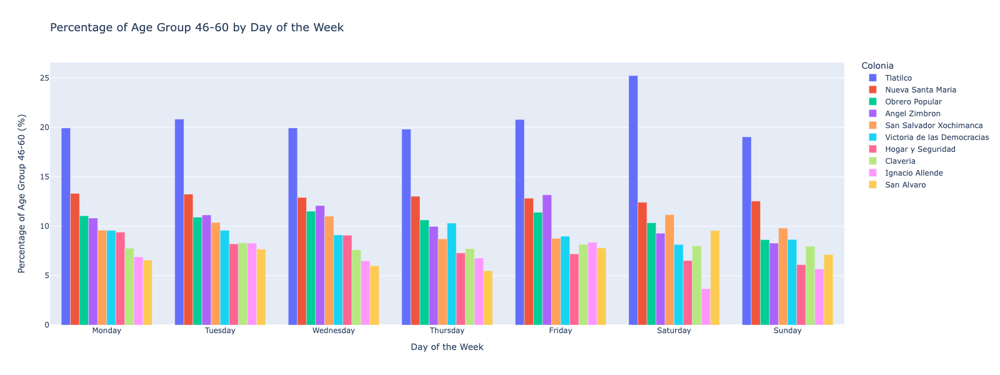

### Age group 46-60 shows highest percentage in tlatilco with 25.2 percent on saturday
### Tlatilco has the highest percent daily out of all other colonias for 46-60 age group

In [ ]:
age_group_36_45_data = azcapo_data[azcapo_data['Age_Group'] == '36-45']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_36_45_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_36_45'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_36_45')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_36_45', 
             color='Colonia', 
             title='Percentage of Age Group 36-45 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_36_45': 'Percentage of Age Group 36-45 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 36-45 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

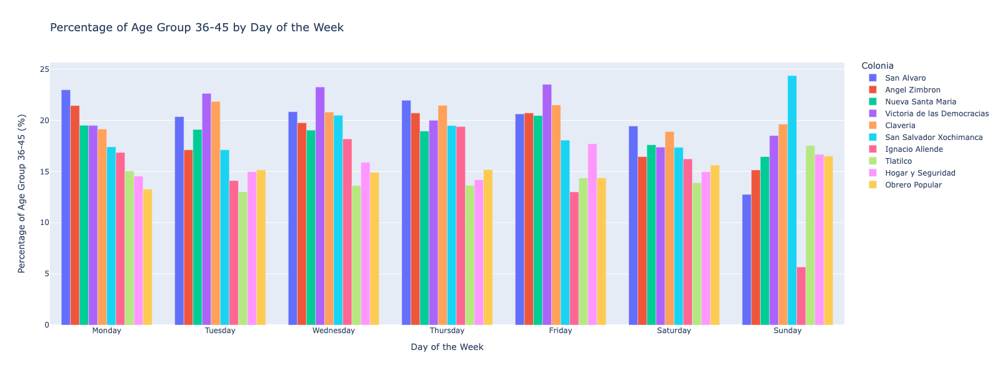

### Age group 36-45 does not show one single colonia stand out as much besides San Salvador xochiminca on sunday with 24.3%

In [ ]:
# Filter the data for the age group 46-60
age_group_26_35_data = azcapo_data[azcapo_data['Age_Group'] == '26-35']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_26_35_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_26_35'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_26_35')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_26_35', 
             color='Colonia', 
             title='Percentage of Age Group 26-35 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_26_35': 'Percentage of Age Group 26-35 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 26-35 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

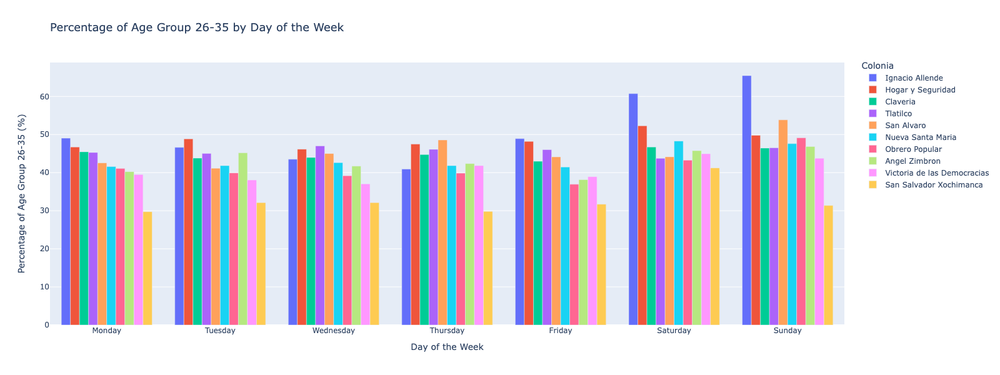

### Age group 26-25 has ignacio allende as the top colonia for both saturday and sunday with above 60%

In [ ]:
# Filter the data for the age group 46-60
age_group_16_25_data = azcapo_data[azcapo_data['Age_Group'] == '16-25']

# Calculate the total trips for each colonia per day of the week
total_trips_per_colonia_day = azcapo_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Total_Trips')

# Calculate the trips for the age group 46-60 for each colonia per day of the week
age_group_trips_per_colonia_day = age_group_16_25_data.groupby(['Colonia', 'Week_Day']).size().reset_index(name='Age_Group_Trips')

# Merge the dataframes to get total trips and age group trips together
merged_data = pd.merge(age_group_trips_per_colonia_day, total_trips_per_colonia_day, on=['Colonia', 'Week_Day'])

# Calculate the percentage of trips for the age group 46-60
merged_data['Percentage_Age_Group_16_25'] = (merged_data['Age_Group_Trips'] / merged_data['Total_Trips']) * 100

# Identify the top 10 colonias with the highest percentage for each day
top_10_colonias_per_day = merged_data.groupby('Week_Day').apply(lambda x: x.nlargest(10, 'Percentage_Age_Group_16_25')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_10_colonias_per_day, 
             x='Week_Day', 
             y='Percentage_Age_Group_16_25', 
             color='Colonia', 
             title='Percentage of Age Group 16-25 by Day of the Week',
             labels={'Week_Day': 'Day of the Week', 'Percentage_Age_Group_16_25': 'Percentage of Age Group 16-25 (%)'},
             height=600, 
             width=1600,
             barmode='group')

fig.update_layout(
    xaxis_title='Day of the Week',
    yaxis_title='Percentage of Age Group 16-25 (%)',
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend=dict(
        orientation='v',
        yanchor='top',
        y=1.02,
        xanchor='left',
        x=1.02
    )
)

# Show the plot
fig.show()

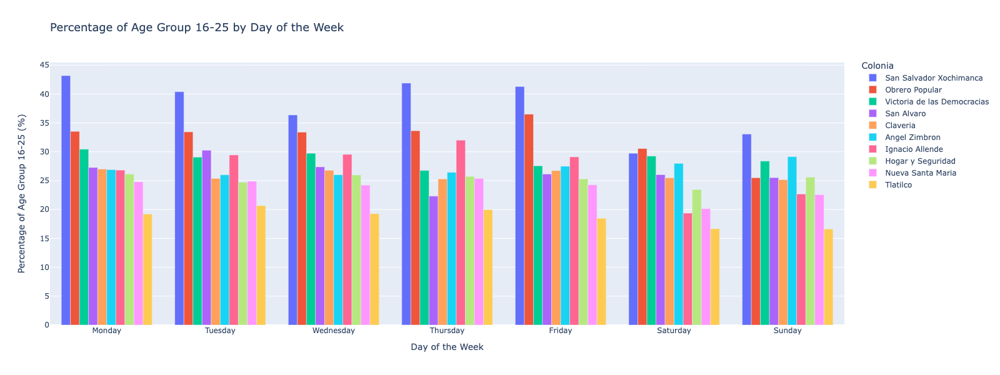

### Age group 16-25 has colonia san salvador xochiminca with the heighest percentage monday - friday above 40% and on sunday with 33%

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia = azcapo_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 10 colonias for each hour by trip count
top_10_colonias_per_hour = trip_count_per_hour_colonia.groupby('Hour').apply(lambda x: x.nlargest(10, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart
fig = px.bar(top_10_colonias_per_hour, x='Hour', y='Trip_Count', color='Colonia', barmode='group',
             title='Colonias by Number of Trips per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

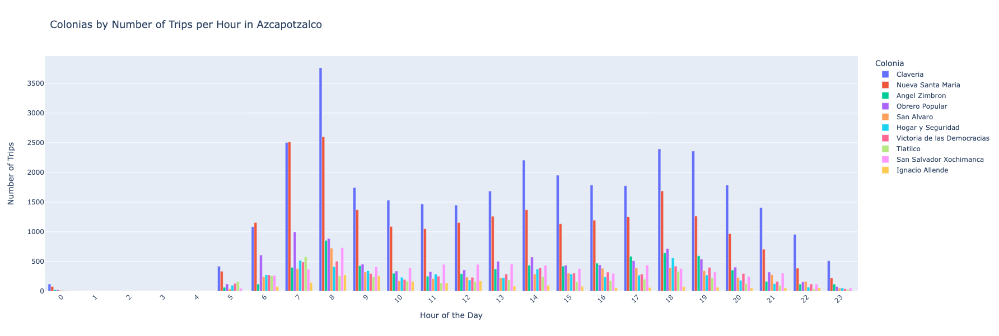

### Hourly data shows that Nueva santa maria records more trips hourly over Claveria from 6-7am 
### 8-23:00 is led by Claveria 

In [ ]:
# Filter the data to include only female users
female_data = azcapo_data[azcapo_data['Gender'] == 'F']

# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_female = female_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour = trip_count_per_hour_colonia_female.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart to visualize the number of trips by hour and colonia
fig = px.bar(top_3_colonias_per_hour, x='Hour', y='Trip_Count', color='Colonia', barmode='group',
             title='Top 3 Colonias with the Highest Number of Female Users per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600  # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

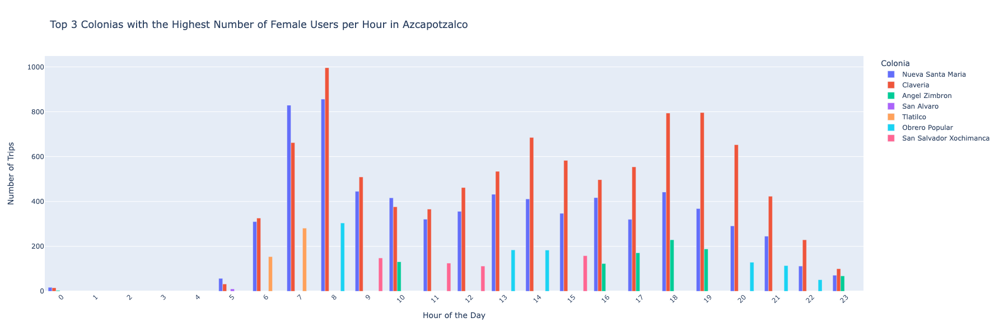

### 7 and 8 am record the highet amound to trip hourly for females in nueva santa maria and claveria 
### Female rides peak at 8am, 2pm and 7pm for claveria

In [ ]:
# Group by 'Hour' and 'Colonia' and calculate the average trip duration
avg_trip_duration_per_hour_colonia_female = female_data.groupby(['Hour', 'Colonia'])['Trip_Duration'].mean().reset_index(name='Avg_Trip_Duration')

# Get the colonia with the highest average trip duration for each hour
max_female_avg_trip_duration_per_hour = avg_trip_duration_per_hour_colonia_female.loc[avg_trip_duration_per_hour_colonia_female.groupby('Hour')['Avg_Trip_Duration'].idxmax()]

# Create a bar chart to visualize the average trip duration by hour and colonia
fig = px.bar(max_female_avg_trip_duration_per_hour, x='Hour', y='Avg_Trip_Duration', color='Colonia', barmode='group',
             title='Colonias with the Highest Average Trip Duration for Female Users per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Avg_Trip_Duration': 'Average Trip Duration (minutes)', 'Colonia': 'Colonia'})

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Average Trip Duration (minutes)',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600 # Set the height of the chart
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

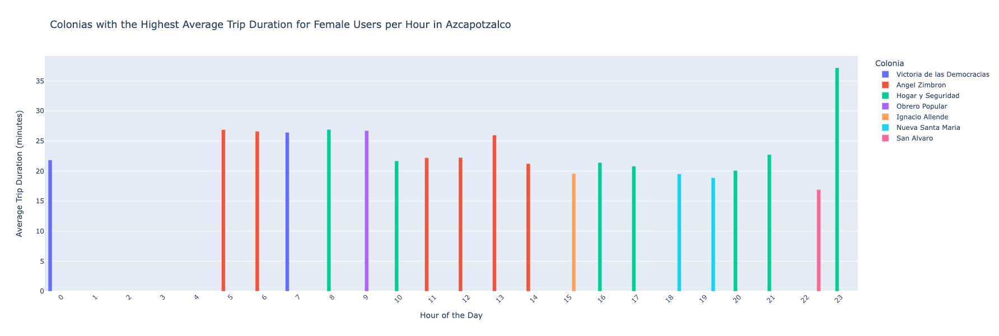

### Highest trip avg hourly shows 11pm for hogar y seguridad with 37.2min
### Top 2 colonias are angel zimbron, hogar y seguridad

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_16_25_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 16-25) per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

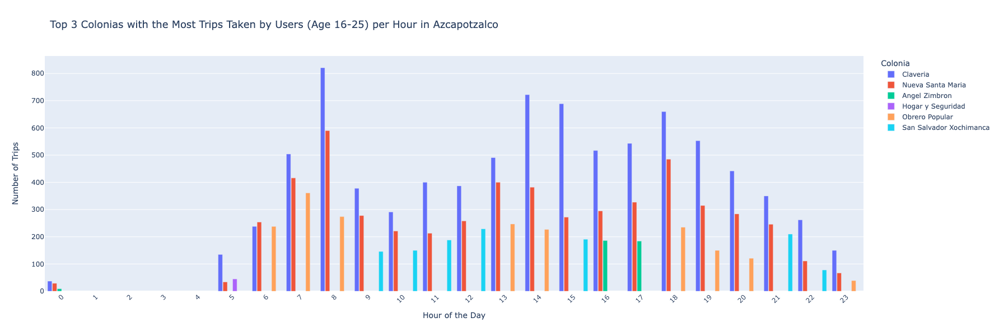

### Trips hourly by age group 16-25 show colonia Claveria peaking at 8am (highest), 2pm and 6pm with nueva santa maria as second 

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_26_35_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 26-35 ) per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

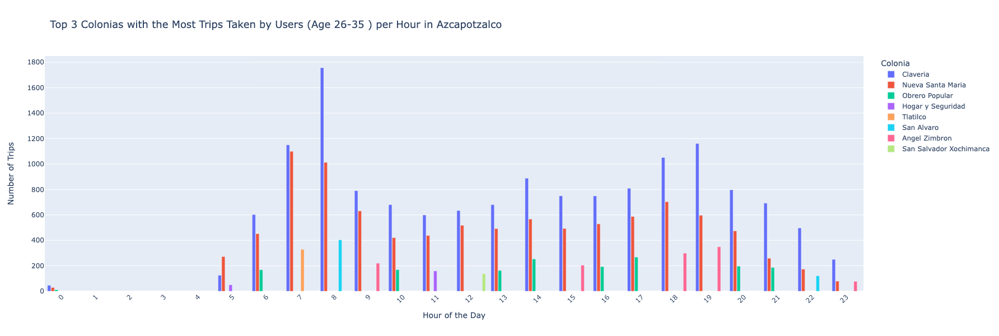

### Age group 26-35 show the same behavior with 8am (highest), 2pm and 7pm for claveria

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_36_45_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 36-45) per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

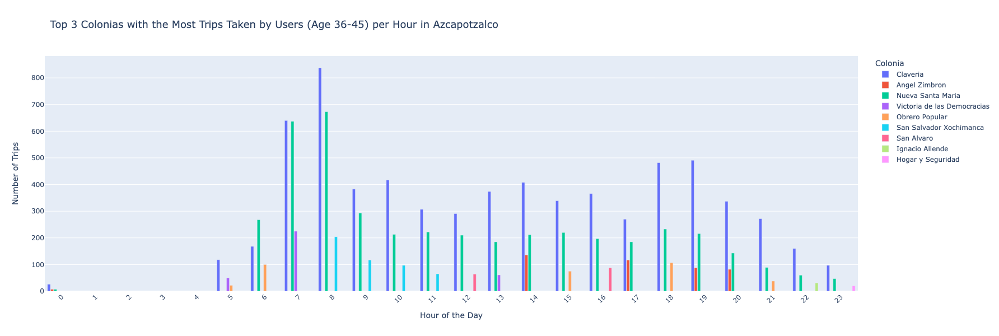

### Age group 36-45 show the highest amount of trips at 8am(highest) , then lower peaks at 2pm and 7pm for claveria 

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_46_60_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 46-60) per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

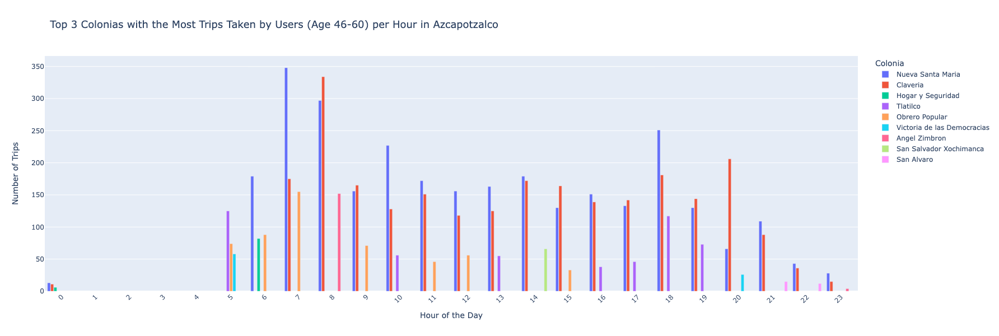

### 46-60 group shows 7am with the highest amount of trips for nueva santa maria  for almost all hours with the exception od 8am, 3pm and 8pm for claveria 

In [ ]:
# Group by 'Hour' and 'Colonia' and count the number of trips
trip_count_per_hour_colonia_age_group = age_group_61_99_data.groupby(['Hour', 'Colonia']).size().reset_index(name='Trip_Count')

# Get the top 3 colonias for each hour by trip count
top_3_colonias_per_hour_age_group = trip_count_per_hour_colonia_age_group.groupby('Hour').apply(lambda x: x.nlargest(3, 'Trip_Count')).reset_index(drop=True)

# Create a bar chart using Plotly
fig = px.bar(top_3_colonias_per_hour_age_group, 
             x='Hour', 
             y='Trip_Count', 
             color='Colonia', 
             title='Top 3 Colonias with the Most Trips Taken by Users (Age 61-99) per Hour in Azcapotzalco',
             labels={'Hour': 'Hour of the Day', 'Trip_Count': 'Number of Trips', 'Colonia': 'Colonia'},
             barmode='group')

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Hour of the Day',
    yaxis_title='Number of Trips',
    xaxis_tickangle=-45,
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    height=600,  # Set the height of the chart
    bargap=0.15,  # Adjust the gap between bars for better visualization
    bargroupgap=0.1  # Adjust the gap between groups of bars
)

# Update x-axis ticks to show all hours from 0 to 23
fig.update_xaxes(tickmode='array', tickvals=list(range(24)))

# Show the plot
fig.show()

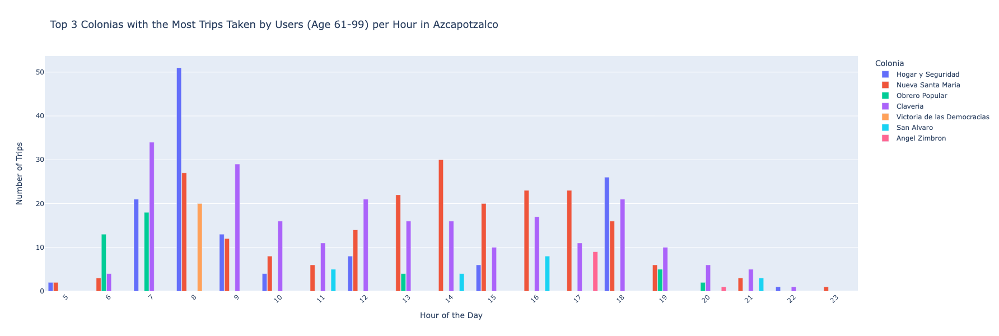

### Age group 61-99 shows higar y seguridad with the most trips out of the entire day at 8am and second most trips at 2pm for nueva santa maria 

# Summary
## Trip Count and Stations:

### - Azcapotzalco shows fewer rides compared to previous alcaldias.
### - Colonia Claveria has the highest trips (32.9k) with 7 stations, followed by Nueva Santa Maria (22.8k) with 6 stations.
### - Colonia Obrero Popular has 8.8k trips with only 2 stations.
### - Stations with high trip counts are concentrated in the top corners and the middle of the alcaldia along main avenues.
## Trip Duration:

### - Hogar y Seguridad has the highest trip duration (19.9 min) with 1 station.
### - Angel Zimbron (19.4 min) and Victoria de las Democracias (18.3 min) also have high trip durations with 1 station each.
### - Stations with high trip duration are located on the top boundary and north-east edge of Azcapotzalco.
## Monthly Data:

### - April is the busiest month, with Claveria recording the highest trips (8.1k).
### - Claveria is the most popular colonia for bike users throughout all months.
### - Nueva Santa Maria is notable for the second highest trips in April (6.7k).
### - No data for June - October due to ECO BICI's introduction of stations in November 2023.
## Age Group Insights:
 
### - Claveria and Nueva Santa Maria have the most trips, with 26-35 age group leading.
### - San Salvador Xochimanca shows more trips by the 16-25 age group than 26-35.
### - Age group 61-99 leads in trip duration in multiple colonias.
## Gender Insights:

### - Males generally use bikes more, except in Tlatilco.
### - Tlatilco records the highest female percentage (38.7%).
### - Trip duration by gender shows males recording longer durations in some colonias.
## Daily Data:

### - Claveria and Nueva Santa Maria lead in daily trip counts, with Tuesday being the most active day.
### - Hogar y Seguridad has the highest trip duration from Monday to Thursday, and Angel Zimbron from Friday to Sunday.
## Hourly Data:

### - Nueva Santa Maria records more trips hourly over Claveria from 6-7 am.
### - Claveria leads from 8 am to 11 pm.
### - Peak hours for female trips are 8 am, 2 pm, and 7 pm in Claveria.

### - Recommendations for Increasing Usage
## Targeting Specific Age Groups:

## 16-25 Age Group:

### - Promote in San Salvador Xochimanca.
### - Campaigns at 8 am, 2 pm, and 6 pm in Claveria.
## 26-35 Age Group:

### - Focus on Claveria and Nueva Santa Maria.
### - Collaborate with businesses for biking to work during peak hours.
## 36-45 Age Group:

### - Target Claveria, especially at 8 am, 2 pm, and 7 pm.
### - Partner with gyms for health and wellness programs.
## 46-60 Age Group:

### - Highlight Nueva Santa Maria for high trip counts at 7 am.
### - Organize community rides in Tlatilco.
## 61-99 Age Group:

### - Promote in Hogar y Seguridad.
### - Develop senior-friendly programs and incentives.
## Targeting Specific Genders:
 
## Females:

### - Focus on Tlatilco.
### - Emphasize safety, offer workshops, and target peak hours in Claveria.
## Males:

### - General promotions across all colonias to sustain and grow usage.